# Restaurant Location Selection in New York City in the Face of COVID-19 Risk 

**Yonggang "Tim" Lu**

## Table of contents
* [Introduction: Business Problem](#introduction)
* [Data](#data)
* [Methodology](#methodology)
* [Analysis](#analysis)
* [Results and Discussion](#results)
* [Conclusion](#conclusion)

**Import needed python libraries**

In [2]:
import numpy as np  # useful for many scientific computing in Python
import pandas as pd # primary data structure library
import json # library to handle JSON files
import requests # library to handle requests
from pandas.io.json import json_normalize # tranform JSON file into a pandas dataframe
import folium # library to create maps

# Matplotlib and associated plotting modules
import matplotlib.cm as cm
import matplotlib.colors as colors

# import k-means from clustering stage
from sklearn.cluster import KMeans

## Introduction: Business Problem <a name="introduction"></a>

In this project, we will uncover some data information about the relationship between local events and places in New York City and the COVID-19 risk.

We are particularly interested in the relationship between local events and places and COVID-19 Case Rate(per 10k) in different NYC neigbhorhoods.  

We will use exploratory analysis approaches to reveal some interesting features of locations in New York City where we observe lower COVID-19 case rate and where we observe higher case rate. The revealed information will help people who are considering to open new restaurants or relocating their restaurants in New York City. 

## Data <a name="data"></a>

### New York City COVID-19 Case Data
We first download COVID-19 case data from the city's <a href="https://www1.nyc.gov/site/doh/covid/covid-19-data-archive.page">COVID-19 data file archive</a>.

In [5]:
# download COVID-19 case data in New York City
url = 'https://raw.githubusercontent.com/nychealth/coronavirus-data/master/data-by-modzcta.csv'
nyc_COVID19=pd.read_csv(url, error_bad_lines=False)
nyc_COVID19['MODIFIED_ZCTA'] = nyc_COVID19['MODIFIED_ZCTA'].astype('int').astype('str')
nyc_COVID19.head()

,MODIFIED_ZCTA,NEIGHBORHOOD_NAME,BOROUGH_GROUP,COVID_CASE_COUNT,COVID_CASE_RATE,POP_DENOMINATOR,COVID_DEATH_COUNT,COVID_DEATH_RATE,PERCENT_POSITIVE,TOTAL_COVID_TESTS
0,10001,Chelsea/NoMad/West Chelsea,Manhattan,376,1595.72,23563.03,21,89.12,14.44,2604
1,10002,Chinatown/Lower East Side,Manhattan,1063,1384.92,76755.41,151,196.73,19.50,5452
2,10003,East Village/Gramercy/Greenwich Village,Manhattan,453,841.98,53801.62,33,61.34,11.25,4028
3,10004,Financial District,Manhattan,31,849.17,3650.61,1,27.39,10.99,282
4,10005,Financial District,Manhattan,63,750.35,8396.11,2,23.82,10.19,618


In [12]:
# import NYC geojson file at postalcode level 
# data source: https://data.cityofnewyork.us/Health/Modified-Zip-Code-Tabulation-Areas-MODZCTA-/pri4-ifjk
!wget --quiet --quiet https://filedn.com/lJpzjOtA91quQEpwdrgCvcy/DS%20Capstone%20Project/ModifiedZipCodeTabulationAreasMODZCTA.geojson -O nyc_geojson.geojson 

### Foursquare Venue Category data
We then scrap <a href="https://developer.foursquare.com/">Foursquare</a> website through its API to download venue category data in different NYC neighborhoods.

In [138]:
# download NYC neighborhood longitude and latitude
# data source: https://geo.nyu.edu/catalog/nyu_2451_34572
!wget -q -O 'newyork_data.json' https://cocl.us/new_york_dataset
with open('newyork_data.json') as json_data:
    newyork_data = json.load(json_data)

In [139]:
neighborhoods_data = newyork_data['features']

In [140]:
# define the dataframe columns
column_names = ['Borough', 'Neighborhood', 'Latitude', 'Longitude'] 
# instantiate the dataframe
nyc_neighborhoods = pd.DataFrame(columns=column_names)

In [141]:
nyc_neighborhoods

,Borough,Neighborhood,Latitude,Longitude


In [142]:
for data in neighborhoods_data:
    borough = neighborhood_name = data['properties']['borough'] 
    neighborhood_name = data['properties']['name']
        
    neighborhood_latlon = data['geometry']['coordinates']
    neighborhood_lat = neighborhood_latlon[1]
    neighborhood_lon = neighborhood_latlon[0]
    
    nyc_neighborhoods = nyc_neighborhoods.append({'Borough': borough,
                                          'Neighborhood': neighborhood_name,
                                          'Latitude': neighborhood_lat,
                                          'Longitude': neighborhood_lon}, ignore_index=True)

In [143]:
 nyc_neighborhoods.head()

,Borough,Neighborhood,Latitude,Longitude
0,Bronx,Wakefield,40.894705,-73.847201
1,Bronx,Co-op City,40.874294,-73.829939
2,Bronx,Eastchester,40.887556,-73.827806
3,Bronx,Fieldston,40.895437,-73.905643
4,Bronx,Riverdale,40.890834,-73.912585


In [144]:
print('The dataframe has {} boroughs and {} neighborhoods.'.format(
        len(nyc_neighborhoods['Borough'].unique()),
        nyc_neighborhoods.shape[0]
    )
)

The dataframe has 5 boroughs and 306 neighborhoods.


Scrap Foursquare website

In [ ]:
CLIENT_ID = '****************************' # Foursquare ID
CLIENT_SECRET = '******************************' # Foursquare Secret
VERSION = '20180605' # Foursquare API version
print('Your credentails:')
print('CLIENT_ID: ' + CLIENT_ID)
print('CLIENT_SECRET:' + CLIENT_SECRET)

In [146]:
def getNearbyVenues(names, latitudes, longitudes, radius=1000, LIMIT=100):
    
    venues_list=[]
    for name, lat, lng in zip(names, latitudes, longitudes):
        print(name)
            
        # create the API request URL
        url = 'https://api.foursquare.com/v2/venues/explore?&client_id={}&client_secret={}&v={}&ll={},{}&radius={}&limit={}'.format(
            CLIENT_ID, 
            CLIENT_SECRET, 
            VERSION, 
            lat, 
            lng, 
            radius, 
            LIMIT)
            
        # make the GET request
        results = requests.get(url).json()["response"]['groups'][0]['items']
        
        # return only relevant information for each nearby venue
        venues_list.append([(
            name, 
            lat, 
            lng, 
            v['venue']['name'], 
            v['venue']['location']['lat'], 
            v['venue']['location']['lng'],  
            v['venue']['categories'][0]['name']) for v in results])

    nearby_venues = pd.DataFrame([item for venue_list in venues_list for item in venue_list])
    nearby_venues.columns = ['Neighborhood', 
                  'Neighborhood Latitude', 
                  'Neighborhood Longitude', 
                  'Venue', 
                  'Venue Latitude', 
                  'Venue Longitude', 
                  'Venue Category']
    
    return(nearby_venues)

In [ ]:
nyc_venues= getNearbyVenues(names=nyc_neighborhoods['Neighborhood'],
                                   latitudes=nyc_neighborhoods['Latitude'],
                                   longitudes=nyc_neighborhoods['Longitude']
                                  )
nyc_venues=nyc_venues.append(nyc_venues_tmp)

In [453]:
print(nyc_venues.shape)
nyc_venues.head()

(20545, 7)


,Neighborhood,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
0,Wakefield,40.894705,-73.847201,Lollipops Gelato,40.894123,-73.845892,Dessert Shop
1,Wakefield,40.894705,-73.847201,Ripe Kitchen & Bar,40.898152,-73.838875,Caribbean Restaurant
2,Wakefield,40.894705,-73.847201,Ali's Roti Shop,40.894036,-73.856935,Caribbean Restaurant
3,Wakefield,40.894705,-73.847201,Carvel Ice Cream,40.890487,-73.848568,Ice Cream Shop
4,Wakefield,40.894705,-73.847201,Jackie's West Indian Bakery,40.889283,-73.843310,Caribbean Restaurant


## Methodology <a name="methodology"></a>

I employed two exploratory data analysis methods in my project. 

The first is Choropleth map using *folium* library that visualizes the COVID-19 case rate(per 10k) in different neighborhoods of New York City. 

The second is K-means clustering that will partition neighborhoods into different clusters based on the group of venues associated with the neighborhoods. As such, neighborhoods in the same cluster are more similar to one another; neighborhoods in different clusters are more dissimilar to one another.

After the K-means clustering is completed, we also summary the 1st, 2nd, and 3rd most common venues in each of the resulted clusters. We then add the clustering results to the Choropleth map created above.

## Analysis <a name="analysis"></a>

### Create the Choropleth map showing the COVID-19 case rate associaed with different neighborhoods

In [6]:
nyc_geo = r'nyc_geojson.geojson' # geojson file
# New York City latitude and longitude values
latitude = 40.7127281
longitude = -74.0060152
# create a plain world map
nyc_map = folium.Map(location=[latitude, longitude], zoom_start=12)

In [ ]:
# generate choropleth map using the COVID-19 Case Rate in New York City
nyc_map.choropleth(
    geo_data=nyc_geo,
    data=nyc_COVID19,
    columns=['MODIFIED_ZCTA', 'COVID_CASE_RATE'],
    key_on='feature.properties.modzcta',
    fill_color='YlOrRd', 
    fill_opacity=0.7, 
    line_opacity=0.2,
    legend_name='COVID-19 Case Rate(per 10k) in New York City'
)

In [8]:
# display map
nyc_map

### Conduct K-means Clustering on Foursquare Venue Categories

Count number of venue categories by neighborhood

In [454]:
nyc_venues.groupby('Neighborhood').count()

,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
Neighborhood,,,,,,
Allerton,63,63,63,63,63,63
Annadale,18,18,18,18,18,18
Arden Heights,23,23,23,23,23,23
Arlington,20,20,20,20,20,20
Arrochar,22,22,22,22,22,22
...,...,...,...,...,...,...
Woodhaven,68,68,68,68,68,68
Woodlawn,47,47,47,47,47,47
Woodrow,17,17,17,17,17,17


In [455]:
print('There are {} uniques categories.'.format(len(nyc_venues['Venue Category'].unique())))

There are 472 uniques categories.


Create dummy variables for different venue categories

In [456]:
# one hot encoding
nyc_onehot = pd.get_dummies(nyc_venues[['Venue Category']], prefix="", prefix_sep="")

# add neighborhood column back to dataframe
nyc_onehot['Neighborhood'] = nyc_venues['Neighborhood'] 

# move neighborhood column to the first column
fixed_columns = [nyc_onehot.columns[-1]] + list(nyc_onehot.columns[:-1])
nyc_onehot = nyc_onehot[fixed_columns]
nyc_onehot.head()

,Zoo Exhibit,Accessories Store,Adult Boutique,Afghan Restaurant,African Restaurant,Airport Lounge,Airport Service,Airport Terminal,American Restaurant,Amphitheater,...,Waterfront,Weight Loss Center,Whisky Bar,Wine Bar,Wine Shop,Winery,Wings Joint,Women's Store,Yoga Studio,Zoo
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [457]:
nyc_venues.head()

,Neighborhood,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
0,Wakefield,40.894705,-73.847201,Lollipops Gelato,40.894123,-73.845892,Dessert Shop
1,Wakefield,40.894705,-73.847201,Ripe Kitchen & Bar,40.898152,-73.838875,Caribbean Restaurant
2,Wakefield,40.894705,-73.847201,Ali's Roti Shop,40.894036,-73.856935,Caribbean Restaurant
3,Wakefield,40.894705,-73.847201,Carvel Ice Cream,40.890487,-73.848568,Ice Cream Shop
4,Wakefield,40.894705,-73.847201,Jackie's West Indian Bakery,40.889283,-73.843310,Caribbean Restaurant


In [471]:
nyc_venues['Venue Category']= np.where((nyc_venues['Venue Category'].astype(str).str.split().str[1] == 'Restaurant'),'Restaurant', nyc_venues['Venue Category'])

In [472]:
print('There are {} uniques categories.'.format(len(nyc_venues['Venue Category'].unique())))

There are 396 uniques categories.


In [473]:
# one hot encoding
nyc_onehot = pd.get_dummies(nyc_venues1[['Venue Category']], prefix="", prefix_sep="")

# add neighborhood column back to dataframe
nyc_onehot['Neighborhood'] = nyc_venues1['Neighborhood'] 

# move neighborhood column to the first column
fixed_columns = [nyc_onehot.columns[-1]] + list(nyc_onehot.columns[:-1])
nyc_onehot = nyc_onehot[fixed_columns]

nyc_onehot.head()

,Zoo Exhibit,Accessories Store,Adult Boutique,Airport Lounge,Airport Service,Airport Terminal,Amphitheater,Animal Shelter,Antique Shop,Aquarium,...,Waterfront,Weight Loss Center,Whisky Bar,Wine Bar,Wine Shop,Winery,Wings Joint,Women's Store,Yoga Studio,Zoo
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [474]:
nyc_onehot.shape

(20545, 396)

Compute mean values of the number of venue categories by neighborhood

In [475]:
nyc_grouped = nyc_onehot.groupby('Neighborhood').mean().reset_index()
nyc_grouped

,Neighborhood,Zoo Exhibit,Accessories Store,Adult Boutique,Airport Lounge,Airport Service,Airport Terminal,Amphitheater,Animal Shelter,Antique Shop,...,Waterfront,Weight Loss Center,Whisky Bar,Wine Bar,Wine Shop,Winery,Wings Joint,Women's Store,Yoga Studio,Zoo
0,Allerton,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.00,0.00,0.0,0.00,0.0,0.00,0.0
1,Annadale,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.00,0.00,0.0,0.00,0.0,0.00,0.0
2,Arden Heights,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.00,0.00,0.0,0.00,0.0,0.00,0.0
3,Arlington,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.00,0.00,0.0,0.05,0.0,0.00,0.0
4,Arrochar,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.00,0.00,0.0,0.00,0.0,0.00,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
297,Woodhaven,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.00,0.00,0.0,0.00,0.0,0.00,0.0
298,Woodlawn,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.00,0.00,0.0,0.00,0.0,0.00,0.0
299,Woodrow,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.00,0.00,0.0,0.00,0.0,0.00,0.0
300,Woodside,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.00,0.00,0.0,0.00,0.0,0.00,0.0


In [476]:
nyc_grouped.shape

(302, 396)

Find the top 10 common venues in different neighborhoods

In [478]:
def return_most_common_venues(row, num_top_venues):
    row_categories = row.iloc[1:]
    row_categories_sorted = row_categories.sort_values(ascending=False)
    
    return row_categories_sorted.index.values[0:num_top_venues]

In [594]:
num_top_venues = 10

indicators = ['st', 'nd', 'rd']

# create columns according to number of top venues
columns = ['Neighborhood']
for ind in np.arange(num_top_venues):
    try:
        columns.append('{}{} Most Common Venue'.format(ind+1, indicators[ind]))
    except:
        columns.append('{}th Most Common Venue'.format(ind+1))

# create a new dataframe
neighborhoods_venues_sorted = pd.DataFrame(columns=columns)
neighborhoods_venues_sorted['Neighborhood'] = nyc_grouped['Neighborhood']

for ind in np.arange(nyc_grouped.shape[0]):
    neighborhoods_venues_sorted.iloc[ind, 1:] = return_most_common_venues(nyc_grouped.iloc[ind, :], num_top_venues)

neighborhoods_venues_sorted.head()

,Neighborhood,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,Allerton,Restaurant,Pizza Place,Deli / Bodega,Donut Shop,Fried Chicken Joint,Fast Food Restaurant,Pharmacy,Sandwich Place,Discount Store,Bar
1,Annadale,Restaurant,Pizza Place,Trail,Dance Studio,Bus Stop,Cosmetics Shop,Deli / Bodega,Park,Food,Diner
2,Arden Heights,Restaurant,Park,Bus Stop,Pharmacy,Pizza Place,Shopping Mall,Coffee Shop,Trail,Bank,Bagel Shop
3,Arlington,Hardware Store,Deli / Bodega,Bus Stop,Convenience Store,Check Cashing Service,Snack Place,Fast Food Restaurant,Donut Shop,Boat or Ferry,Discount Store
4,Arrochar,Restaurant,Bus Stop,Beach,Baseball Field,Steakhouse,Park,Bagel Shop,Outdoors & Recreation,Sandwich Place,Historic Site


Select the optimal K value based on the Elbow method

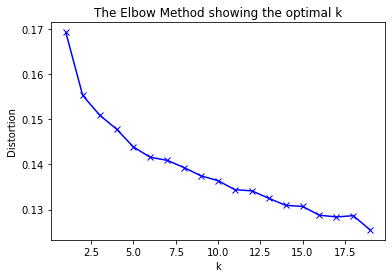

In [497]:
from sklearn.cluster import KMeans
from sklearn import metrics
from scipy.spatial.distance import cdist
import matplotlib.pyplot as plt

nyc_grouped_clustering = nyc_grouped.drop('Neighborhood', 1)

# k means determine k
distortions = []
K = range(1,20)
for k in K:
    kmeanModel = KMeans(n_clusters=k).fit(nyc_grouped_clustering)
    kmeanModel.fit(nyc_grouped_clustering)
    distortions.append(sum(np.min(cdist(nyc_grouped_clustering, kmeanModel.cluster_centers_, 'euclidean'), axis=1)) / nyc_grouped_clustering.shape[0])

# Plot the elbow
plt.plot(K, distortions, 'bx-')
plt.xlabel('k')
plt.ylabel('Distortion')
plt.title('The Elbow Method showing the optimal k')
plt.show()

The optimal k value is determined to be 6

Perform the K-means clustering (K=6)

In [595]:
# set number of clusters
kclusters = 6

manhattan_grouped_clustering = nyc_grouped.drop('Neighborhood', 1)

# run k-means clustering
kmeans = KMeans(n_clusters=kclusters, random_state=0).fit(manhattan_grouped_clustering)

# check cluster labels generated for each row in the dataframe
kmeans.labels_[0:11] 

array([4, 3, 3, 4, 1, 1, 0, 4, 0, 0, 5])

Label each cluster using its top 3 common venues

In [596]:
# add clustering labels
neighborhoods_venues_sorted.insert(0, 'Cluster Labels', kmeans.labels_)
nyc_merged = nyc_neighborhoods
nyc_merged = nyc_merged.join(neighborhoods_venues_sorted.set_index('Neighborhood'), on='Neighborhood')
nyc_merged = nyc_merged.dropna(subset=['Cluster Labels'])

# identify the top 3 most common venues in each cluster (the top 3 venues are not necessarily different in one cluster)
first=nyc_merged[["Cluster Labels", "1st Most Common Venue"]].groupby(['Cluster Labels']).agg(lambda x:x.value_counts().index[0])
first_venue=first.groupby(['Cluster Labels']).agg(lambda x:x.value_counts().index[0])
first_venue.rename(columns={"1st Most Common Venue": "1st"}, inplace=True)

second=nyc_merged[["Cluster Labels", "2nd Most Common Venue"]].groupby(['Cluster Labels']).agg(lambda x:x.value_counts().index[0])
second_venue=second.groupby(['Cluster Labels']).agg(lambda x:x.value_counts().index[0])
second_venue.rename(columns={"2nd Most Common Venue": "2nd"}, inplace=True)

third=nyc_merged[["Cluster Labels", "3rd Most Common Venue"]].groupby(['Cluster Labels']).agg(lambda x:x.value_counts().index[0])
third_venue=third.groupby(['Cluster Labels']).agg(lambda x:x.value_counts().index[0])
third_venue.rename(columns={"3rd Most Common Venue": "3rd"}, inplace=True)

nyc_merged=pd.merge(nyc_merged, first_venue, on='Cluster Labels', how='left')
nyc_merged=pd.merge(nyc_merged, second_venue, on='Cluster Labels', how='left')
nyc_merged=pd.merge(nyc_merged, third_venue, on='Cluster Labels', how='left')

### Add the K-means clustering results to the map

In [597]:
# set color scheme for the clusters
x = np.arange(kclusters)
ys = [i + x + (i*x)**2 for i in range(kclusters)]
colors_array = cm.rainbow(np.linspace(0, 1, len(ys)))
rainbow = [colors.rgb2hex(i) for i in colors_array]

# add markers to the map and lable the markers with cluster id and its top 3 most common venues
markers_colors = []
for lat, lon, poi, cluster, first, second, third in zip(nyc_merged['Latitude'], nyc_merged['Longitude'], 
                                  nyc_merged['Neighborhood'], nyc_merged['Cluster Labels'],
                                  nyc_merged["1st"],
                                  nyc_merged["2nd"],
                                  nyc_merged["3rd"],):
   # label = folium.Popup(str(poi) + ' Cluster ' + str(int(cluster)), parse_html=True)
    folium.CircleMarker(
        [lat, lon],
        radius=5,
         popup = ('Cluster: '+ str(cluster)+'<br>'+ first + ', '+ second+', '+ third),
        color=rainbow[int(cluster)-1],
        fill=True,
       fill_color=rainbow[int(cluster)-1],
        fill_opacity=0.7).add_to(nyc_map)   

In [598]:
nyc_map

## Results and Discussion <a name="results"></a>

As seen in the map above, most neighborhoods belonging to CLuster 5 have relatively lower COVID-19 case rate. The top 3 common venue categories in the cluster is "Restaurant", "Park", and "Coffee shop". It is not a surprise to see "Restaurant" among the top categories since it is the case for all other clusters too. Instead, what's interesting is that "Park" appears to be a very common venue category in the neighborhoods.

On the other hand, from the following map, most neighborhoods belonging to Cluster 1 have relatively higher COVID-19 case rate. "Beach" is the very common venue category among those neighborhoods. 

My data analysis reveals some interesting features of locations in New York City where we observe lower COVID-19 case rate and where we observe higher case rate. As suggested by our analysis results, the neighborhoods with more parks have less COVID-19 risk. In contrary, if one neighborhood is near crowded beach, there will be high COVID-19 risk. 

## Conclusion <a name="conclusion"></a>

In this project, I collected geographical data related to COVID-19 cases and local events and places in New York City. I analyzed the data collection using two exploratory methods, namely, Choropleth map and K-means clustering. The analysis results reveal valuable data information about the relationship betwee the two pieces of data. The revealed information supports meaningful recommendations to people who are considering to open new restaurants or relocating their restaurants in New York City. 